In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns


sns.set()

#-------------------- 차트 관련 속성 (한글처리, 그리드) -----------
plt.rcParams['font.family']= 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

#-------------------- 주피터 , 출력결과 넓이 늘리기 ---------------
# from IPython.core.display import display, HTML
from IPython.display import display, HTML

display(HTML("<style>.container{width:100% !important;}</style>"))
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('max_colwidth', None)

import warnings
warnings.filterwarnings(action='ignore')

In [2]:
# ----------------- 학습 ----------------------
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression



# ----------------- 평가 ----------------------
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve

from sklearn.metrics import roc_auc_score, roc_curve, plot_roc_curve

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

from pycaret.classification import *

# Data Load

In [3]:
# column_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
# df = pd.read_csv('./datasets/housing.csv', header=None, delimiter=r"\s+", names=column_names)

<pre>
CRIM    : 범죄율  
          per capita crime rate by town
ZN      : 거주지비율(25,000 sq.ft.초과) 
          proportion of residential land zoned for lots over 25,000 sq.ft.
INDUS   : 상업지비율(비소매)
          proportion of non-retail business acres per town
CHAS    : 찰스강인접여부(1:인접,0:그외)
          Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
NOX     : 산화질소농도
          nitric oxides concentration (parts per 10 million)
RM      : 방갯수
          average number of rooms per dwelling
AGE     : 인접한 노후건물 비율 (1940년 이전)
          proportion of owner-occupied units built prior to 1940
DIS     : 고용센터와의 거리
          weighted distances to ﬁve Boston employment centers
RAD     : 고속도로 인접
          index of accessibility to radial highways
TAX     : 재산세
          full-value property-tax rate per $10,000
PTRATIO : 교사/학생 비율
          pupil-teacher ratio by town 12. 
B       : 흑인비율
          1000(Bk−0.63)2 where Bk is the proportion of blacks by town 13. 
LSTAT   : 인전한 하위계층 비율
          % lower status of the population
MEDV    : 집가격 (단위 1000) ------------------------------------------------타겟
          Median value of owner-occupied homes in $1000s

In [4]:
from sklearn.datasets import load_boston
dataset = load_boston()

In [5]:
df = pd.DataFrame(dataset['data'], columns = dataset['feature_names'])
df['MEDV'] = dataset['target']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


In [6]:
df.head(2)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.9,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.9,9.14,21.6


array([[<AxesSubplot: title={'center': 'CRIM'}>,
        <AxesSubplot: title={'center': 'ZN'}>,
        <AxesSubplot: title={'center': 'INDUS'}>,
        <AxesSubplot: title={'center': 'CHAS'}>],
       [<AxesSubplot: title={'center': 'NOX'}>,
        <AxesSubplot: title={'center': 'RM'}>,
        <AxesSubplot: title={'center': 'AGE'}>,
        <AxesSubplot: title={'center': 'DIS'}>],
       [<AxesSubplot: title={'center': 'RAD'}>,
        <AxesSubplot: title={'center': 'TAX'}>,
        <AxesSubplot: title={'center': 'PTRATIO'}>,
        <AxesSubplot: title={'center': 'B'}>],
       [<AxesSubplot: title={'center': 'LSTAT'}>,
        <AxesSubplot: title={'center': 'MEDV'}>, <AxesSubplot: >,
        <AxesSubplot: >]], dtype=object)

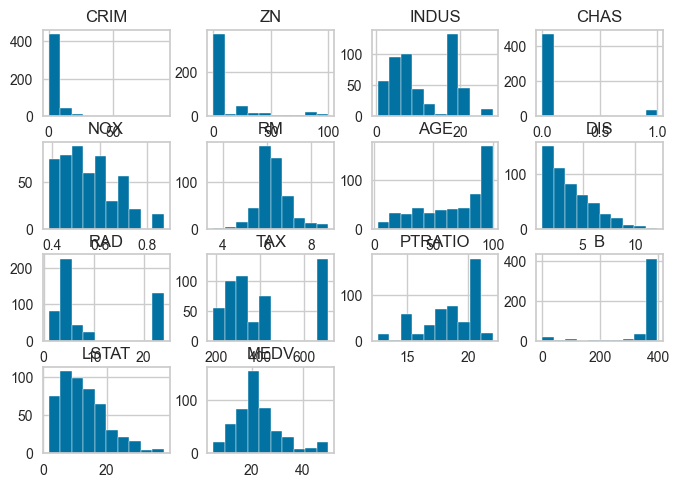

In [7]:
df.hist()

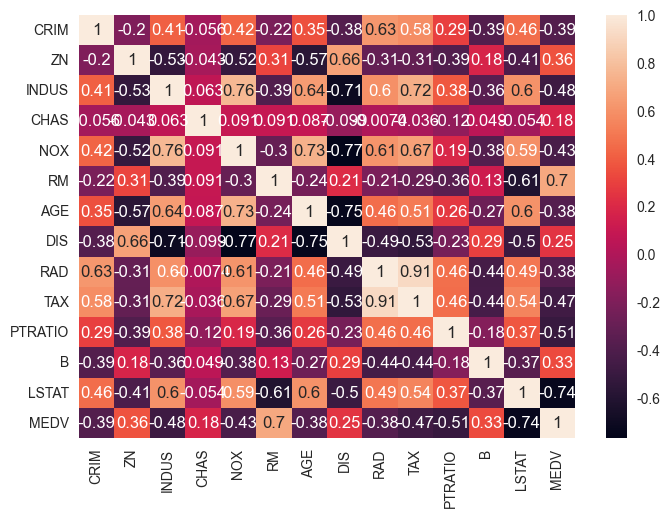

In [8]:
plt.figsize = (18,18)
sns.heatmap(df.corr(),annot=True)
plt.show()

In [9]:

# from pycaret.utils import create_profile



# # Generate profile report and save as HTML file
# create_profile(data, profile=True, html=True, html_file='housing_profile.html')

In [10]:
s = setup(df, target = 'MEDV', silent=True, profile=True, session_id=1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsClassifier,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDClassifier,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessClassifier,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron.MLPClassifier,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [ ]:
best_model_list = compare_models(sort='Accuracy', n_select = 3)
best_model_list

IntProgress(value=0, description='Processing: ', max=79)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,15:28:15
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Linear Discriminant Analysis


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)


In [ ]:
y=df['MEDV']
X=df.drop("MEDV", axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

In [ ]:
lr=LogisticRegression()
lr.fit(X_train, y_train)
pred = lr.predict(X_test)
mse = mean_squared_error(y_test, pred)
mse